# Stochastic Interest Rates and Swaptions

In [1]:
import numpy as np
import pandas as pd
from scipy.stats import norm
from tqdm import tqdm  #### loop 
import plotly
import numpy as np
import plotly.graph_objects as go
import matplotlib.pyplot as plt
import scipy.stats as stats
from sklearn.neighbors import KernelDensity
from scipy.stats import norm, gaussian_kde
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from matplotlib import cm
from matplotlib.ticker import LinearLocator
import scipy.integrate as integrate

In [2]:
# time setting
T = 10
ndt = 365*T #length of time interval =length of t
t = np.linspace (0,T,ndt)
dt = t[1]-t[0]
r0 = 0.02
theta0 = 0.03
alpha = 3 # k
sigma = 0.01 
beta = 1
phi = 0.05
eta = 0.005
nsims=1000

In [3]:
def simtheta (t,beta,phi,eta,nsims):
    ndt = len(t)
    dt = t[1]-t[0]
    sqrt_dt = np.sqrt(dt)
    
    theta_t=np.zeros((nsims,ndt))
    theta_t[:,0] = theta0
    
    for i in range(len(t)-1):
        theta_t[:,i+1]=theta_t[:,i]+beta*(phi-theta_t[:,i])*dt+eta*sqrt_dt*np.random.randn(nsims)
    
    return theta_t


def simr (t,alpha,theta,sigma,nsims):
    ndt = len(t)
    dt = t[1]-t[0]
    sqrt_dt = np.sqrt(dt)
    
    rt=np.zeros((nsims,ndt))
    rt[:,0] = r0
    
    for i in range(len(t)-1):
        rt[:,i+1]=rt[:,i]+alpha*(theta[:,i]-rt[:,i])*dt+sigma*sqrt_dt*np.random.randn(nsims)
    
    return rt

def BondYp (t,rt,nsims):
    
    delta_t = np.zeros((nsims,ndt))
    for i in range(1,len(t)):
        delta_t[:,i]=rt[:,i-1]*dt
    # short rate integral
    integral_r = np.zeros((nsims,ndt))
    integral_r = np.cumsum(delta_t,axis=1)
    
    #bond price and bond yield
    bondprice = np.mean(np.exp(-integral_r),axis=0)
    bondyield = np.zeros(len(t))
    bondyield[0] = np.mean(rt[:,0])
    bondyield[1:]=-np.log(bondprice[1:])/t[1:]
    
    return bondyield,bondprice

In [4]:
#analyitical
def B(alpha,t):
    B_t = (1-np.exp(-alpha*t))/alpha
    return B_t

def C(alpha,beta,t,B_t):
    C_t = (alpha/(alpha-beta))*((1-np.exp(-beta*t))/beta - B_t)
    return C_t

def A(alpha,beta,sigma,phi,eta,t,B_t,C_t):
    O1 = t/beta**2-(2*(B_t+C_t))/beta**2+(1-np.exp(-2*alpha*t))/(2*alpha*(alpha-beta)**2)
    
    O21 = -(2*alpha/(beta*(alpha-beta)**2))*(1-np.exp(-(alpha+beta)*t))/(alpha+beta)
    O22= ((alpha/(beta*(alpha-beta)))**2)*((1-np.exp(-2*beta*t))/(2*beta))
    O2=O21+O22
    
    A_t = (B_t-t)*(phi-sigma**2/(2*alpha**2))+C_t*phi-(sigma*B_t)**2/(4*alpha)+0.5*(eta**2)*(O1+O2)
    return A_t

In [5]:
def bond_sim (alpha,beta,sigma,phi,eta,t,nsims):
    theta=simtheta(t,beta,phi,eta,nsims)
    rt=simr(t,alpha,theta,sigma,nsims)
    bondyield,bondprice = BondYp(t,rt,1000)
    
    return bondyield #,bondprice

In [6]:
def bond_analytical (alpha,beta,sigma,phi,eta,t):
    B_t=B(alpha,t)
    C_t=C(alpha,beta,t,B_t)
    A_t=A(alpha,beta,sigma,phi,eta,t,B_t,C_t)
    return (-A_t+B_t*r0+C_t*theta0)/t

#base case
r0 = 0.02
theta0 = 0.03
alpha = 3 # k
sigma = 0.01 
beta = 1
phi = 0.05
eta = 0.005
nsims=1000

In [7]:
theta=simtheta(t,beta,phi,eta,nsims)

In [8]:
rt=simr(t,alpha,theta,sigma,nsims)

In [9]:
def bond_analytical (alpha,beta,sigma,phi,eta,t):
    B_t=B(alpha,t)
    C_t=C(alpha,beta,t,B_t)
    A_t=A(alpha,beta,sigma,phi,eta,t,B_t,C_t)
    return (-A_t+B_t*r0+C_t*theta0)/t

In [10]:
B_t=B(alpha,t)
C_t=C(alpha,beta,t,B_t)
A_t=A(alpha,beta,sigma,phi,eta,t,B_t,C_t)

# Forward Neutral Measure

In [11]:
T1=3*365
T2=5*365

In [12]:
# simulate long rate
def simtheta_T1(t,beta,phi,eta,nsims):
    ndt = len(t)
    dt = t[1]-t[0]
    sqrt_dt = np.sqrt(dt)
    
    B_t=B(alpha,t)
    C_t=C(alpha,beta,t,B_t)
    
    thetaT1=np.zeros((nsims,ndt))
    thetaT1[:,0]=theta0
    
    for i in range(len(t)-1):
        thetaT1[:,i+1]=thetaT1[:,i]+(beta*(phi-thetaT1[:,i])-eta**2*C_t[i])*dt+eta*sqrt_dt*np.random.randn(nsims)
    return thetaT1

In [13]:
def simrT1 (t,alpha,thetaT1, sigma,nsims):
    ndt = len(t)
    dt = t[1]-t[0]
    sqrt_dt = np.sqrt(dt)
    
    B_t=B(alpha,t)
    
    rt_T1 = np.zeros((nsims,ndt))
    rt_T1[:,0]=r0
    
    for i in range(len(t)-1):
        rt_T1[:,i+1]=rt[:,i]+(alpha*(thetaT1[:,i]-rt_T1[:,i])-sigma**2*B_t[i])*dt+sigma*sqrt_dt*np.random.randn(nsims)
    
    return rt_T1
    

In [14]:
thetaT1 = simtheta_T1(t[:T1],beta,phi,eta,nsims=1000)

In [15]:
fig = go.Figure()
for i in range(25):
    fig.add_trace(go.Scatter(x=t,y=thetaT1[i,:], name = "Path"+str(i+1)))

fig.update_layout(title = "Sample Path - T1 Bond Measure",
                  xaxis_title="t",yaxis_title=r"$\theta_t$", 
                 font=dict(size=18,color="black"))
fig.show()  


In [16]:
rt_T1=simrT1(t[:T1],alpha,thetaT1,sigma,nsims=1000) #get risk neurtal interest rate

In [17]:
fig = go.Figure()
for i in range(25):
    fig.add_trace(go.Scatter(x=t,y=rt_T1[i,:], name = "Path"+str(i+1)))

fig.update_layout(title = "Sample Path - T1",
                  xaxis_title="t",yaxis_title="$r_t$", 
                 font=dict(size=18,color="black"))
fig.show()  

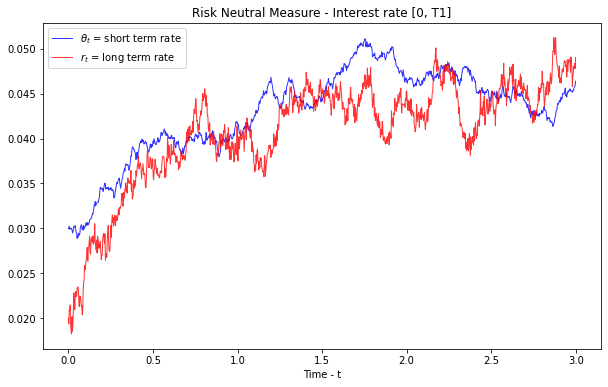

In [18]:
plt.figure(figsize=(10,6))
plt.plot(t[:T1],thetaT1[1,:],linewidth=1,color='blue',alpha=0.8,label=r"$\theta_t$ = short term rate")
plt.plot(t[:T1],rt_T1[1,:],linewidth=1,color='red',alpha=0.8,label=r"$r_t$ = long term rate")
plt.xlabel("Time - t")
plt.title("Risk Neutral Measure - Interest rate [0, T1]")
plt.legend()
plt.show()

Analytical calculation

In [19]:
# get analyitical price for bond
bondprice_analy=np.exp(A_t-B_t*r0-C_t*theta0)
# find strike price l = P0(T2)/P0(T1)
#forward rate
p0T1_analy = bondprice_analy[T1]
p0T2_analy = bondprice_analy[T2]
k_analy = p0T2_analy/p0T1_analy

simulate rt_T1, thetaT1 and strike price list

In [20]:
#get strike price list
alpha_l=np.arange(0.95,1.05,0.01)
k_T1 = alpha_l*k_analy
k_T1

array([0.86071173, 0.86977186, 0.87883198, 0.8878921 , 0.89695223,
       0.90601235, 0.91507248, 0.9241326 , 0.93319272, 0.94225285,
       0.95131297])

In [21]:
thetaT1=simtheta_T1(t[:T1],beta,phi,eta,nsims=1000)
rt_T1=simrT1(t[:T1],alpha,thetaT1,sigma,nsims=1000)#get risk neutral interest rate
# calculate P_T1(T2)
delt=(T2-T1)/365 #5-3=2
Bdt=B(alpha,delt)
Cdt=C(alpha,beta,delt,Bdt)
Adt=A(alpha,beta,sigma,phi,eta,delt,Bdt,Cdt)
#print(Adt,Bdt,Cdt)
pt1t2_T1=np.exp(Adt-Bdt*rt_T1[:,-1]-Cdt*thetaT1[:,-1]) #get price_t1t2

average payoff times P0(T1) - forward measure

In [22]:
# average payoff times P0(T1) - forward measure
payoffT1=(pt1t2_T1-k_analy)*(pt1t2_T1>k_analy)
bondoption_P1T1 = np.mean(payoffT1)*p0T1_analy
bondoption_P1T1

0.001050684506941437

In [23]:
bondoption_P1T1 = np.mean(payoffT1)*p0T1_analy

In [24]:
# bond option price with various strike
bondoption_PT1 = np.zeros(k_T1.shape)
for i in range(len(k_T1)):
    Aa=pt1t2_T1>k_T1[i]
    payoffT1=Aa*(pt1t2_T1-k_T1[i])
    bondoption_PT1[i] = np.mean(payoffT1)*p0T1_analy
bondoption_PT1

array([4.01796850e-02, 3.21561503e-02, 2.41326157e-02, 1.61090810e-02,
       8.08735371e-03, 1.05068451e-03, 8.71774784e-07, 0.00000000e+00,
       0.00000000e+00, 0.00000000e+00, 0.00000000e+00])

analytical forward bond option price

In [25]:
def bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l):
    sigma_square = integrate.quad(lambda x: eta**2*(alpha/(alpha-beta))**2 *
                              (1/beta*(-np.exp(-beta*(T2/365-x)) +np.exp(-beta*(T1/365-x)) )
                               + 1/alpha*(np.exp(-alpha*(T2/365-x))-np.exp(-alpha*(T1/365-x))) )**2,0,T1/365)
    o_square = integrate.quad(lambda x: sigma**2/(alpha**2)*(-np.exp(-alpha*(T2/365-x))+np.exp(-alpha*(T1/365-x)))**2,0,T1/365)
    sigma_sq=sigma_square[0]
    o_sq=o_square[0]
    
    x0 = bondprice_analy[T2]/bondprice_analy[T1]
    
    du=(np.log(1/alpha_l)+0.5*(o_sq+sigma_sq))/(np.sqrt(sigma_sq+o_sq))
    dl=(np.log(1/alpha_l)-0.5*(o_sq+sigma_sq))/(np.sqrt(sigma_sq+o_sq))
    
    p0T1_analy = bondprice_analy[T1]
    p0T2_analy = bondprice_analy[T2]
    bondoption_analy = p0T2_analy*norm.cdf(du)-p0T1_analy*k_T1*norm.cdf(dl)
    return bondoption_analy

In [26]:
bondoption_analy1=bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l)

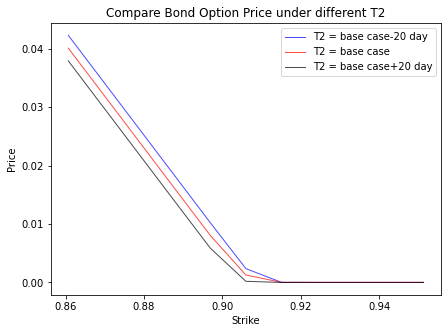

In [27]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2-20,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='blue',alpha=0.7,label="T2 = base case-20 day")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='red',alpha=0.7,label="T2 = base case")
plt.plot(k_T1,bondoption_analytical(T1,T2+20,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='black',alpha=0.7,label="T2 = base case+20 day")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different T2")
plt.legend()
plt.show()

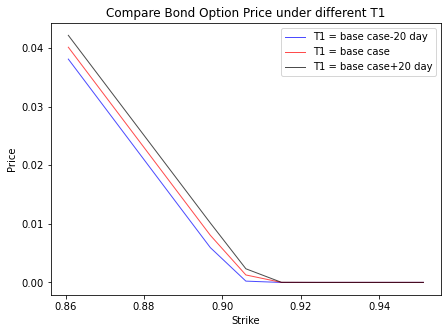

In [28]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1-20,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='blue',alpha=0.7,label="T1 = base case-20 day")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='red',alpha=0.7,label="T1 = base case")
plt.plot(k_T1,bondoption_analytical(T1+20,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='black',alpha=0.7,label="T1 = base case+20 day")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different T1")
plt.legend()
plt.show()

In [29]:
def bond_price_analytical(alpha,beta,sigma,phi,eta,t):
    B_t=B(alpha,t)
    C_t=C(alpha,beta,t,B_t)
    A_t=A(alpha,beta,sigma,phi,eta,t,B_t,C_t)
    return np.exp(A_t-B_t*r0-C_t*theta0)

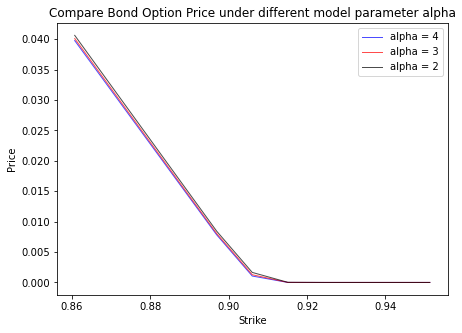

In [30]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2,5,beta,sigma,eta,bond_price_analytical(5,beta,sigma,phi,eta,t),alpha_l),linewidth=1,color='blue',alpha=0.7,label="alpha = 4")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='red',alpha=0.7,label="alpha = 3")
plt.plot(k_T1,bondoption_analytical(T1,T2,2,beta,sigma,eta,bond_price_analytical(2,beta,sigma,phi,eta,t),alpha_l),linewidth=1,color='black',alpha=0.7,label="alpha = 2")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different model parameter alpha")
plt.legend()
plt.show()

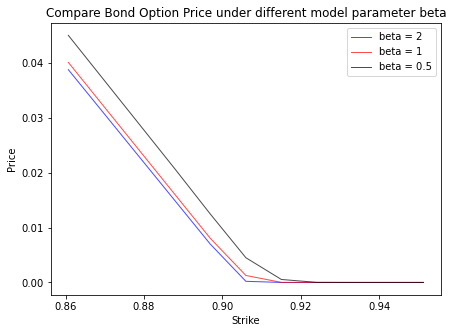

In [31]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,2,sigma,eta,bond_price_analytical(alpha,2,sigma,phi,eta,t),alpha_l),linewidth=1,color='blue',alpha=0.7,label="beta = 2")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='red',alpha=0.7,label="beta = 1")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,0.5,sigma,eta,bond_price_analytical(alpha,0.5,sigma,phi,eta,t),alpha_l),linewidth=1,color='black',alpha=0.7,label="beta = 0.5")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different model parameter beta")
plt.legend()
plt.show()

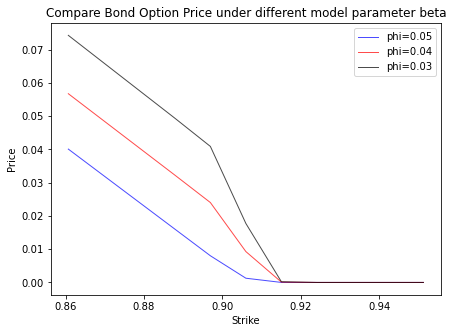

In [32]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='blue',alpha=0.7,label="phi=0.05")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bond_price_analytical(alpha,beta,sigma,0.04,eta,t),alpha_l),linewidth=1,color='red',alpha=0.7,label="phi=0.04")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bond_price_analytical(alpha,beta,sigma,0.03,eta,t),alpha_l),linewidth=1,color='black',alpha=0.7,label="phi=0.03")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different model parameter beta")
plt.legend()
plt.show()

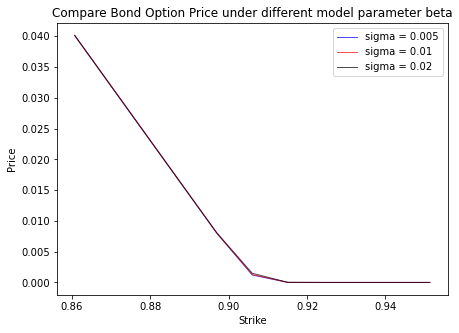

In [33]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,0.005,eta,bond_price_analytical(alpha,beta,0.005,phi,eta,t),alpha_l),linewidth=1,color='blue',alpha=0.7,label="sigma = 0.005")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='red',alpha=0.7,label="sigma = 0.01")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,0.02,eta,bond_price_analytical(alpha,beta,0.02,phi,eta,t),alpha_l),linewidth=1,color='black',alpha=0.7,label="sigma = 0.02")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different model parameter beta")
plt.legend()
plt.show()

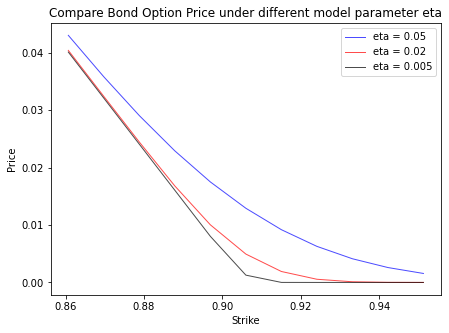

In [34]:
plt.figure(figsize=(7,5))
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,0.05,bond_price_analytical(alpha,beta,sigma,phi,0.05,t),alpha_l),linewidth=1,color='blue',alpha=0.7,label="eta = 0.05")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,0.02,bond_price_analytical(alpha,beta,sigma,phi,0.02,t),alpha_l),linewidth=1,color='red',alpha=0.7,label="eta = 0.02")
plt.plot(k_T1,bondoption_analytical(T1,T2,alpha,beta,sigma,eta,bondprice_analy,alpha_l),linewidth=1,color='black',alpha=0.7,label="eta = 0.005")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under different model parameter eta")
plt.legend()
plt.show()

In [35]:
# Risk neutral
pt1t2_T1_B=np.exp(Adt-Bdt*rt[:,T1]-Cdt*theta[:,T1]) 
bondoption_P = np.zeros(k_T1.shape)
for i in range(len(k_T1)):
    Aa=pt1t2_T1_B>k_T1[i]
    payoff=Aa*(pt1t2_T1_B-k_T1[i])
    bondoption_P[i] = np.mean(payoff*p0T1_analy)

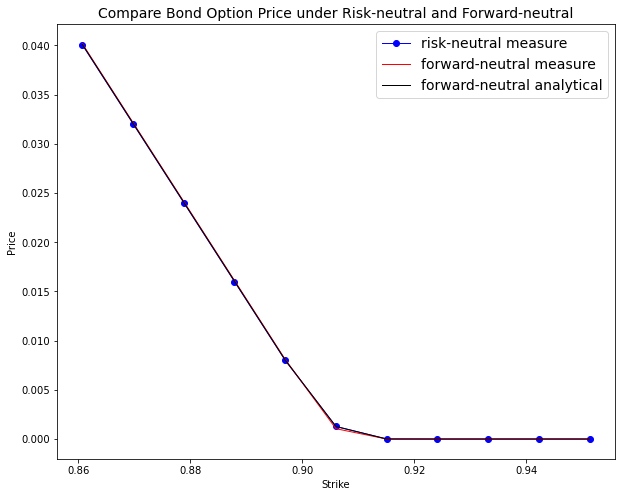

In [36]:
plt.figure(figsize=(10,8))
plt.plot(k_T1,bondoption_P,'go-',linewidth=1,color='blue',alpha=1,label="risk-neutral measure")
plt.plot(k_T1,bondoption_PT1, linewidth=1,color='red',alpha=1,label="forward-neutral measure")
plt.plot(k_T1,bondoption_analy1,linewidth=1,color='black',alpha=1,label="forward-neutral analytical")
plt.xlabel("Strike")
plt.ylabel("Price")
plt.title("Compare Bond Option Price under Risk-neutral and Forward-neutral",fontsize=14)
plt.legend(fontsize=14)
plt.show()